## Introduction to Trip Planning Enhancement Analysis 🌟

In our quest to refine and elevate the trip planning experience, this is a thorough analysis of the platform's current challenges and opportunities. This document synthesizes my findings into actionable insights, aimed at addressing key errors, optimizing the trip builder, and setting the stage for strategic evolution in our product and technology offerings.

### Importing packages

In [ ]:
import pandas as pd
import warnings
from ydata_profiling import ProfileReport

import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
import scipy.stats as stats
import calendar

# import warnings

In [ ]:
# warnings.filterwarnings('ignore')
# warnings.filterwarnings("ignore", category=DeprecationWarning) 

### Importing the dataframe

In [ ]:
df = pd.read_csv('reporting-trip-request-extract.csv')

### Importing functions

In [4]:
%run functions.ipynb

### Total (Rows,columns)

In [5]:
df.shape

(5000, 35)

### Renaming the columns for better readability

In [6]:
cols_to_rename = {'badproportionerrorcount':'badproportion_ERR',
                 'firstchoiceaccommodationunavailablecount':'firstaccommodation_ERR',
                 'noavailabledotwaccommodationerrorcount':'DOTW_ERR',
                 'nofamilymanualfallbackserrorcount':'manualfallback_ERR',
                 'nogoodscoreerrorcount':'nogoodscore_ERR',
                  'accommodationunavailableerrorcount':'accommodation_ERR',
                 'substituteaccommodationunavailablecount':'substaccommodation_ERR',
                 'timeouterrorcount':'timeout_ERR',
                 'tripbuildtimeseconds':'tripbuildtime',
                 'failtimeseconds':'failtime',
                 'aborteddataerrorcount':'aborteddata_ERR',
                 'failureindurationserrorcount':'failureinduration_ERR',
                 'norouteserrorcount':'noroutes_ERR',
                 'overnightreductionerrorcount':'overnightreduction_ERR',
                 'transportunavailableerrorcount':'transportunavailable_ERR'}


df = df.rename(columns=cols_to_rename)

for col in df.columns:
    col1 = col.replace('createtripformsubmission_','')
    df = df.rename(columns={col:col1})

## Generating a Comprehensive Profile Report 📊

To gain a deeper understanding of our dataset and to ensure thorough analysis, we'll generate a comprehensive profile report. This report will include detailed statistics, distributions, and correlations for all columns within our dataset. It's an essential step for preliminary data exploration, helping us identify potential data quality issues, outliers, and patterns that could inform further analysis and modeling decisions.

In [7]:
profile_report = ProfileReport(df)
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Insights from the report

## 🌍 Regional Preferences

- **Top Destinations**: The most searched regions showcase diverse interests:
  - 🏞 **Highlands & Islands**: 17% of searches, highlighting its popularity for scenic landscapes.
  - 🌊 **Italian Riviera**: 11%, known for its picturesque coastlines.
  - 🍇 **Northern Italy**: 11%, sought after for its rich history and cuisine.

## 👫 Adult Count in Group

- **Travel Dynamics**:
  - **Couples Dominance**: A whopping 75% of searches are for 2 adults, underscoring a strong preference for couple or small group travels.

## 👨‍👩‍👧 Child Inclusion

- **Family Travel Insights**:
  - **Adult-Only Preference**: A vast majority (80%) of searches involve no children, indicating a trend towards adult-centric travel plans.
  - **Single Child Families**: 11% of searches include one child, pointing to some interest in family travel.

## 🌆 Origin Cities

- **Leading Departure Points**:
  - 🇬🇧 **London**: The primary starting point for trips, reflecting its status as a major travel hub.
  - 🇫🇷 **Paris** and 🇬🇧 **Manchester** follow, showcasing their significance in travel planning.

## 🛏 Room Count

- **Accommodation Type**:
  - **Single-Room Preference**: Dominating with 85% of searches, indicating a strong preference for solo or couple travelers.
  - **Multiple Rooms**: Less common at 12%, highlighting lesser demand for group or family accommodations.

## ✅ Trip Success

- **Builder Efficiency**:
  - **High Success**: An impressive success rate of 97% shows the trip builder's capability in fulfilling user requests efficiently.

## 🛌 Twin Room Preference

- **Room Selection**:
  - **Non-Twin Preference**: A significant 88% of travelers prefer accommodations other than twin rooms, suggesting varied accommodation desires.

---

### 📊 Insights Summary

- **Diverse Destinations**: Interest spans from the serene Highlands & Islands to the culturally rich Northern Italy, indicating varied traveler preferences.
- **Travel Composition**: Data reveals a preference for traveling in pairs and primarily adult groups, with limited searches including children.
- **Accommodation Choices**: There's a clear trend towards single-room bookings, reflecting the popularity of solo and couple travels.
- **Efficient Planning**: The high success rate emphasizes the trip builder's effectiveness, showcasing its ability to meet diverse traveler needs.

### Looking at the report, we will handle each column for missing values separately

In [8]:
# missing values
df['failtime'] = df['failtime'].fillna(0)
df['tripbuildtime'] = df['tripbuildtime'].fillna(100000)
df['array_to_string'] = df['array_to_string'].fillna('NA')

df['creationdate'] = pd.to_datetime(df['creationdate'])
df['requestdate'] = pd.to_datetime(df['requestdate'])
df['preferreddate'] = pd.to_datetime(df['preferreddate'])

df['creationdate'] = df['creationdate'].fillna(df['requestdate'] + pd.to_timedelta(100, unit='D'))

## Optimizing the Dataset for Analysis 🛠️

Upon reviewing the comprehensive profile report, we've identified columns that exhibit minimal variability — either showcasing a constant value across the dataset or having 99% of the values being identical. To streamline our dataset and enhance the efficiency of our analysis, we will proceed to remove these columns. Additionally, the `closestcity_id` column will be excluded from further analysis due to its redundancy or lack of relevance to our objectives. This step ensures our dataset is primed for deeper, more meaningful insights.

In [9]:
columns_to_drop = ['aborteddata_ERR','accommodation_ERR','failureinduration_ERR','fastjourney','overnightreduction_ERR','jotform_onewaytrip',
                   'closestcity_id','extrainfo','transportunavailable_ERR','directjourney']

df = df.drop(columns=columns_to_drop)

In [10]:
# cleaning and standardizing date-related information and extracting useful time-based features like weekdays and hours from dates. 
# preparing the data for deeper analysis by enhancing its structure and readability.
df = column_conversions(df)

C:\Users\shash\AppData\Local\Temp\ipykernel_22516\2030049154.py:398: FutureWarning: The 'downcast' keyword in fillna is deprecated and will be removed in a future version. Use res.infer_objects(copy=False) to infer non-object dtype, or pd.to_numeric with the 'downcast' keyword to downcast numeric results.
  .fillna(0, downcast='infer'))


### Profile report for the converted columns

In [11]:
consider_cols = ['childages','preferred_year','preferred_month','preferred_weekday','creation_weekday','creation_hour','request_weekday','request_hour']
df_tmp = df[consider_cols]

In [12]:
profile_report = ProfileReport(df_tmp)
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
result_df = df[['Arts and Culture', 'Food and Drink',
       'Good for kids', 'History', 'NA', 'Nature', 'Nightlife', 'Relaxation']].sum().reset_index().rename(columns={'index':'interests',0:'count'})

In [14]:
result_df['percentage'] = (result_df['count'] / result_df['count'].sum()) * 100
result_df.sort_values('percentage',ascending=False).reset_index(drop=True)

,interests,count,percentage
0,History,3201,20.816804
1,Food and Drink,3135,20.387592
2,Nature,2953,19.204006
3,Relaxation,2847,18.514665
4,Arts and Culture,1774,11.536711
5,Good for kids,816,5.306627
6,Nightlife,537,3.492229
7,NA,114,0.741367


## Insights from the above profile report (newly converted columns)


## 🧒 Child Ages in Groups

- **Family Composition Insights**:
  - The majority of trip searches **do not include children** (80%), emphasizing a trend towards adult-centric travel.
  - Searches for trips with children aged **6 to 8 years** represent a niche interest, pointing towards targeted opportunities for family-friendly travel offerings.

## 📅 Travel Planning by Year

- **Forward-Looking Travel Plans**:
  - **Near-Term Planning**: A significant focus on 2024 (95%) for trip searches reflects immediate travel interests.
  - **Future Planning**: There's a gradual interest in travel for years up to 2028, highlighting some long-term planning among travelers.

## 🗓 Monthly Travel Preferences

- **Seasonal Travel Trends**:
  - The preference for **March to July** for travel, with March (25%) and July (13%) being particularly popular, highlights peak travel seasons aligning with spring and summer.

## 📅 Weekday Travel Preferences

- **Preferred Weekdays for Travel**:
  - Interest is spread across the week with **Monday and Friday** showing slight preferences, indicating flexibility in start days for planned trips.

## 🕒 Time of Day for Trip Searches

- **Evening Planning Peak**:
  - A significant number of searches occur between **7pm and 10pm**, suggesting evenings as the preferred time for travel planning activities.

## 🏞 Interests Driving Travel

- **Key Travel Motivations**:
  - Interests in **History** and **Food and Drink** dominate, followed by **Nature** and **Relaxation**, showcasing a broad spectrum of motivations for travel.

## 🇬🇧 Impact of UK Bank Holidays and School Term Holidays on Travel

- **UK Bank Holidays**:
  - Key bank holidays like **Good Friday** and **Easter Monday** may influence travel planning, potentially increasing demand around these dates.
  
- **UK School Term Holidays**:
  - **School holidays**, such as the February half term and Easter holidays, likely impact family travel decisions, with increased searches for travel during these periods indicating a need for tailored travel options to accommodate family needs.

---

### 📊 Insights Summary

- **Adult-Centric vs. Family Travel**: While adult-only trips dominate search trends, there's a clear but specific interest in travel with school-aged children, highlighting a market for family-oriented travel packages.
- **Immediate vs. Long-Term Planning**: The data reveals a strong immediate focus on the coming year with some looking further ahead, offering opportunities to market both last-minute deals and early bird specials.
- **Peak Times for Planning and Travel**: Evening hours are prime for planning, and spring to early summer months are preferred for travel, aligning with school holidays and bank holidays.
- **Diverse Travel Motivations**: A wide range of interests drive travel planning, suggesting the value of diverse and personalized travel experiences.


### Error Columns

In [15]:
error_columns = ['DOTW_ERR','firstaccommodation_ERR','substaccommodation_ERR','manualfallback_ERR','noroutes_ERR',
                 'badproportion_ERR','timeout_ERR','nogoodscore_ERR']

# Calculate summary statistics for the updated list of error counts
updated_error_summary = df[error_columns].describe()

updated_error_summary

,DOTW_ERR,firstaccommodation_ERR,substaccommodation_ERR,manualfallback_ERR,noroutes_ERR,badproportion_ERR,timeout_ERR,nogoodscore_ERR
count,5000.0000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,1.9886,1.404000,0.76780,0.039200,1.120400,0.400000,0.094800,0.015600
std,37.3858,12.920517,12.93792,1.347749,4.294321,3.399222,0.325322,0.157993
min,0.0000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.0000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.0000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.0000,1.000000,0.00000,0.000000,1.000000,0.000000,0.000000,0.000000
max,1118.0000,396.000000,396.00000,62.000000,134.000000,88.000000,2.000000,4.000000


## Error Columns Insights

### 🚫 DOTW_ERR 

- **High Variance**: With a max of 1118 and a std deviation of 37.39, this error shows significant variability, indicating occasional but significant challenges in securing DOTW accommodations.

### 🏠 firstaccommodation_ERR 

- **Common Issue**: The mean of 1.404 and max of 396 suggest that first choice accommodation unavailability is a frequent issue, potentially impacting user satisfaction.

### 🔄 substaccommodation_ERR 

- **Less Frequent**: A lower mean (0.768) compared to first accommodation errors, but with the same max (396), indicating that while substitute accommodations can also be hard to find, it's less common than first choice issues.

### 🖐 manualfallback_ERR 

- **Rare but Present**: With a low mean (0.0392) and a max of 62, manual fallbacks are infrequently needed, highlighting a generally successful automation but room for improvement in handling edge cases.

### 🛣 noroutes_ERR 

- **Route Planning Issues**: A mean of 1.1204 and max of 134 point to occasional difficulties in route planning, an area for potential optimization in the trip builder.

### ⚖ badproportion_ERR 

- **Occasional Imbalance**: With a mean of 0.4 and max of 88, this error reflects issues with trip balance, suggesting the need for better proportioning of trip elements.

### ⏲ timeout_ERR

- **Infrequent Timeouts**: A low mean (0.0948) and a max of 2 show that system timeouts are rare, indicating good system performance but still a point for monitoring.

### 📊 nogoodscore_ERR

- **Very Rare Scoring Issues**: The lowest mean (0.0156) and a max of 4 indicate that issues with scoring trips are very rare, suggesting effective trip scoring mechanisms.

---

### 📈 Summary

- **Accommodation Challenges**: The significant variance in DOTW_ERR and frequent firstaccommodation_ERR highlight a critical area for improvement in accommodation sourcing and availability.
- **Route Optimization**: The noroutes_ERR statistics suggest that enhancing route planning algorithms could further reduce planning errors.
- **Manual Interventions**: Although manualfallback_ERR occurrences are low, optimizing for even fewer manual interventions could improve operational efficiency.
- **Balanced Trip Planning**: Addressing the badproportion_ERR by refining algorithms to ensure trip balance could enhance user satisfaction.


In [16]:
# Create a figure for the box plots
plt.figure(figsize=(12, 4))

# Creating box plots
sns.boxplot(data=df[error_columns])
plt.xticks(rotation=45)
plt.title("Box Plot of Error Columns")
plt.ylabel("Error Count")
plt.show()

C:\Users\shash\AppData\Local\Temp\ipykernel_22516\2879242509.py:9: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [16]:
outlier_counts(df,error_columns)

,lower_bound,upper_bound,outliers_count
DOTW_ERR,0.0,0.0,139.0
firstaccommodation_ERR,-1.5,2.5,92.0
substaccommodation_ERR,0.0,0.0,227.0
manualfallback_ERR,0.0,0.0,5.0
noroutes_ERR,-1.5,2.5,538.0
badproportion_ERR,0.0,0.0,453.0
timeout_ERR,0.0,0.0,424.0
nogoodscore_ERR,0.0,0.0,57.0


## Detailed Outlier Analysis Report 📊

- **DOTW_ERR**: Detected **139 outliers**, indicating instances where Direct On The Web errors significantly deviate from common occurrences.
- **First Accommodation ERR**: Uncovered **92 outliers**, with values stretching beyond the typical range, suggesting unusual booking error frequencies.
- **Substitute Accommodation ERR**: Found **227 outliers**, highlighting considerable variations in substitute accommodation booking errors.
- **Manual Fallback ERR**: Identified a minimal **5 outliers**, pointing to rare but notable deviations in manual fallback interventions.
- **No Routes ERR**: A notable **538 outliers** were observed, suggesting significant discrepancies in route availability errors.
- **Bad Proportion ERR**: **453 outliers** were identified, indicating substantial departures in the distribution of trip balance errors.
- **Timeout ERR**: Detected **424 outliers**, underscoring instances of atypical system response delays.
- **No Good Score ERR**: Found **57 outliers**, highlighting unusual occurrences in trip quality scoring deviations.

The analysis effectively brings to light data points that fall outside the expected error count ranges, providing us with invaluable insights into the dataset's integrity and the error types requiring closer examination. These outlier counts offer a pivotal foundation for subsequent data cleaning, analysis refinement, and decision-making processes.


## Correlation between Error columns

In [17]:
df4 = df[error_columns+['success']].copy()

corr_matrix=df4.corr()

mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True

f,ax=plt.subplots(figsize=(8,4))
sns.heatmap(corr_matrix, mask=mask, annot=True)
plt.suptitle('Correlation Matrix')
plt.xticks(rotation=45, ha="right")
plt.show()

C:\Users\shash\AppData\Local\Temp\ipykernel_152\4192755980.py:12: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


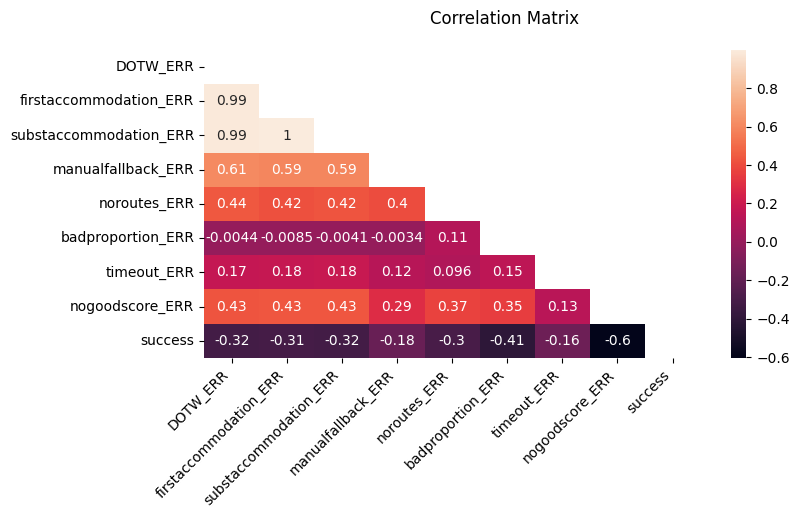

In [17]:
df4 = df[error_columns+['success']].copy()

corr_matrix=df4.corr()

mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True

f,ax=plt.subplots(figsize=(8,4))
sns.heatmap(corr_matrix, mask=mask, annot=True)
plt.suptitle('Correlation Matrix')
plt.xticks(rotation=45, ha="right")
plt.show()

## Insights from Correlation Analysis on Errors


### 🚫 Accommodation-Related Errors

- **High Impact on Success**: `DOTW_ERR`, `firstaccommodation_ERR`, and `substaccommodation_ERR` show strong negative correlations with success (-0.318, -0.313, and -0.321 respectively), indicating that accommodation issues significantly reduce trip planning success.

### 🖐 Manual Fallbacks

- **Moderate Influence**: `manualfallback_ERR` has a moderate negative correlation with success (-0.178), suggesting that while manual interventions are effective, they might not always lead to optimal outcomes.

### 🛣 Route Planning

- **Considerable Effect**: `noroutes_ERR` also negatively impacts success (-0.302), underscoring the importance of efficient route planning in successful trip building.

### ⚖ Trip Balance

- **Significant Negative Correlation**: `badproportion_ERR` shows a notably strong negative correlation with `success` (-0.413), highlighting the critical role of balanced trip planning.

### ⏲ System Performance

- **Less Impactful**: `timeout_ERR` shows a lesser negative correlation with `success` (-0.157), indicating timeouts are a minor factor affecting success.

### 📊 Scoring Mechanisms

- **Highest Negative Impact**: `nogoodscore_ERR` has the strongest negative correlation with `success` (-0.604), suggesting that effective trip scoring is paramount for successful trip planning.

---

### 📈 Summary

- **Accommodation and Scoring Key**: The highest priorities for improving trip success involve addressing accommodation-related errors and refining scoring mechanisms, as these have the greatest impact on success.
- **Enhance Route Planning**: Optimizing route planning could significantly improve success rates, mitigating the `noroutes_ERR` effect.
- **Balance and Timeliness**: Addressing `badproportion_ERR` and monitoring `timeout_ERR` are critical for enhancing the user experience and success rates.


## ⚙️Error Causation and Relationships

A concise overview of how specific errors in the trip planning process might lead to or influence other errors:

### Direct Causation Chain

- **Accommodation Challenges**: `DOTW_ERR` leads to `firstaccommodation_ERR`, which can cause `substaccommodation_ERR`, potentially necessitating `manualfallback_ERR` for resolution.

### Independent Errors with Indirect Influence

- **Route and Scoring Challenges**: `noroutes_ERR` affects `nogoodscore_ERR` indirectly, indicating planning difficulties impact overall trip quality.

### System and Cumulative Effects

- **System Performance**: `timeout_ERR` is a standalone issue impacting task completions but does not directly cause planning errors.
- **Overall Trip Quality**: `nogoodscore_ERR` aggregates the impact of various errors, reflecting on the trip's total score.ntified.


<img src="img1.png" alt="Image" width="950" height="800" align="center">

### 🎯 Prioritization and Strategy

- **Primary Focus Areas**:
  - **Accommodation Sourcing**: Prioritizing `DOTW_ERR` resolution will naturally decrease related accommodation errors.
  - **Algorithm Enhancements**: Upgrading route planning and scoring algorithms directly addresses `noroutes_ERR` and improves `nogoodscore_ERR`.
  - **Trip Balance**: Solving `badproportion_ERR` ensures well-balanced trips, enhancing satisfaction.
  
- **Secondary Considerations**:
  - **De-emphasize Effects**: `substaccommodation_ERR` and `manualfallback_ERR` should receive less immediate focus, benefiting from primary error improvements.
  - **System Performance**: While `timeout_ERR` is important, its direct impact on planning success is less than the core errors identified.


In [18]:
# This function categorizes various columns in a dataset for more nuanced analysis
df,categorical_cols = bucketizing_columns(df)

## 🔍 Kruskal-Wallis H Test: Error Column vs. Non-Error Categorical Columns

The Kruskal-Wallis H test is a non-parametric method used to determine if there are statistically significant differences between the medians of two or more groups. In the context of analyzing an error column against non-error categorical columns in trip planning data:

- **Objective**: This test helps identify if different categories (e.g., regions, time periods, user groups) experience varying levels of planning errors, which can be crucial for targeted improvements.
- **Rationale**: Since planning errors can directly impact user satisfaction and system efficiency, understanding their distribution across categorical variables enables data-driven decision-making.

## 📊 In-depth Analysis of DOTW Error Rates

In [109]:
target_col = 'DOTW_ERR'

all_results_df = pd.DataFrame(columns=['categorical_column', 'p_value'])

# Loop through the columns and perform tests
for col in categorical_cols:
    #print(col)
    results_df = kruskal_h_test(df, target_col, col)
    all_results_df = pd.concat([all_results_df, results_df], ignore_index=True)

# Print the combined results DataFrame
kruskal_df = all_results_df[(all_results_df['p_value']<=0.05)].sort_values(by='p_value',ascending=True).reset_index(drop=True)
kruskal_df

C:\Users\shash\AppData\Local\Temp\ipykernel_22484\1786221536.py:9: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  all_results_df = pd.concat([all_results_df, results_df], ignore_index=True)
C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  h_statistic, p_value = stats.kruskal(*[group[target_col] for name, group in df.groupby(col)])
C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a f

,categorical_column,p_value
0,closestcity,6.314432e-134
1,region,8.302484e-50
2,roomcount,2.034543e-37
3,preferred_month,1.272207e-15
4,creation_weekday,4.203073e-14
5,childcount,2.905985e-12
6,trip_duration_bucket,4.383688e-12
7,preferred_quarter,9.164834e-10
8,lead_time_category,1.464852e-07
9,adultcount,1.532291e-06


Following the Kruskal-Wallis H test results, we'll dive deeper into understanding how the DOTW (Directly On The Web) error rates are influenced across various categorical dimensions. The significant p-values indicate strong statistical evidence to further explore these areas:

### 1. 🏙️ DOTW Error Rate by Closest City + Region
- **Objective**: Investigate how geographic factors influence the occurrence of DOTW errors. The extremely low p-value (`6.314432e-134` for `closestcity` and `8.302484e-50` for `region`) underscores the substantial impact of location on error rates.

## NOTE: 📈 Normalized Error Rate Rationale

To ensure a fair analysis of error occurrences across various categories, we utilize the **normalized error rate**-calculated as the ratio of errors to searches for each categorical value. This approach addresses a crucial analytical challenge:

### Why Normalize?

- **Equal Footing**: Normalizing by searches accounts for variations in popularity among categories. Without normalization, categories with more searches might misleadingly appear to have more errors simply due to their higher activity levels, not necessarily a higher error propensity.
- **Accurate Insights**: By comparing errors relative to searches (`errors / searches`), we can accurately identify which categories truly have higher error rates, enabling targeted improvements where they are most needed.

This normalization ensures our analysis is not skewed by the sheer volume of searches, leading to more reliable insights and effective decision-making.



C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:245: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='normalized_error_rate', y='group_label', data=filtered_df_reset, palette="viridis")


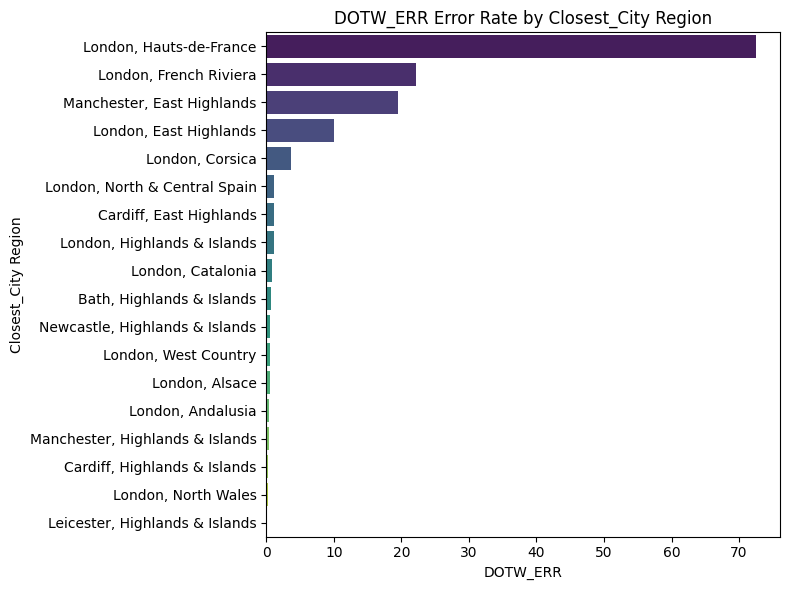

In [80]:
target_col = 'DOTW_ERR'
cols = ['closestcity', 'region']
col_names = 'Closest_City Region'
df_tmp = df.copy()
filtered_df_reset = grouped_error_rate_2(df_tmp,target_col,cols,col_names,8,6)

### 🔍 Analyzing the DOTW error rates by Closest City and Region

### High Error Rates

- **London & Hauts-de-France**: With an astonishing error rate of `72.4375%`, this combination stands out, indicating a substantial mismatch in accommodation availability.
- **Significant Variations**: London paired with the French Riviera and Manchester with the East Highlands show notably high error rates (`22.146341%` and `19.454545%`, respectively), suggesting regional popularity or limited accommodation options might be contributing factors.

### Moderate to Low Error Rates

- **Diverse Destinations**: Lower error rates are observed in combinations like London with Corsica (`3.62963%`) and further down with regions like Andalusia (`0.377953%`) and North Wales (`0.214286%`), indicating better alignment between search volume and available accommodations.

### Lowest Error Rates

- **Optimal Matches**: Very low error rates in regions like Leicester with the Highlands & Islands (`0.071429%`) suggest some city-region pairs experience minimal booking challenges, possibly due to less demand or more efficient accommodation handling.


### 2. 📅 DOTW Error Rate by Closest City + Region and Preferred Months
- **Objective**: Seasonal variations could significantly affect accommodation availability, leading to variations in DOTW errors. A low p-value (`1.272207e-15` for `preferred_month`) supports this hypothesis, suggesting a need to analyze error rates in the context of time.

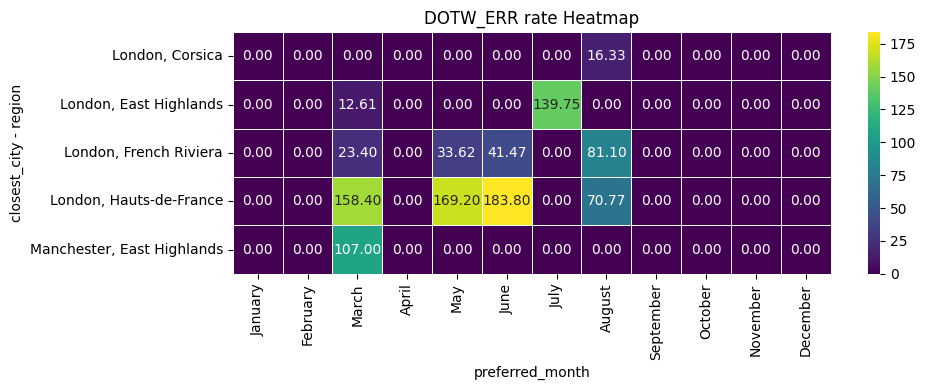

In [37]:
group_col1 = 'closestcity'
group_col2 = 'region'
col1 = 'closest_city - region'
col2 = 'preferred_month'
target_bucket = 'DOTW_ERR'
order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df_tmp[col1] = df_tmp[group_col1] + ', ' + df_tmp[group_col2]
result = heatmap2(df_tmp,filtered_df_reset,col1,col2,target_bucket,order)

### 🔍 Analyzing DOTW Error Rate by Closest City + Region and Preferred Months

The analysis reveals significant variations in DOTW error rates across different city-region combinations over preferred months, highlighting seasonal impacts on accommodation booking challenges:

### Seasonal Peaks

- **London & Hauts-de-France**: Exhibits extremely high error rates in March (158.4%) and May (169.2%), suggesting intense demand or limited supply during early spring.
- **London & French Riviera**: Peaks during the summer months, especially in August (81.1%), indicating summer as a critical period for booking challenges in this popular destination.

### Specific Highs

- **London, East Highlands**: Shows a singular high spike in July (139.75%), possibly due to specific events or seasonal attractions.
- **Manchester, East Highlands**: Notable error rate in March (107%), highlighting regional specificities in booking demand.

### Zero Error Months

- Across the board, several city-region pairs like **London, Corsica** show a zero error rate for most of the year except for specific months, underscoring targeted periods of high demand or system strain.


### 3. 📆 DOTW Error Rate by Closest City + Region and Preferred Weekday
- **Objective**: Understanding if planning preferences towards certain weekdays influence DOTW error rates can offer insights into user behavior and system performance (`p-value: 4.203073e-14` for `creation_weekday`).

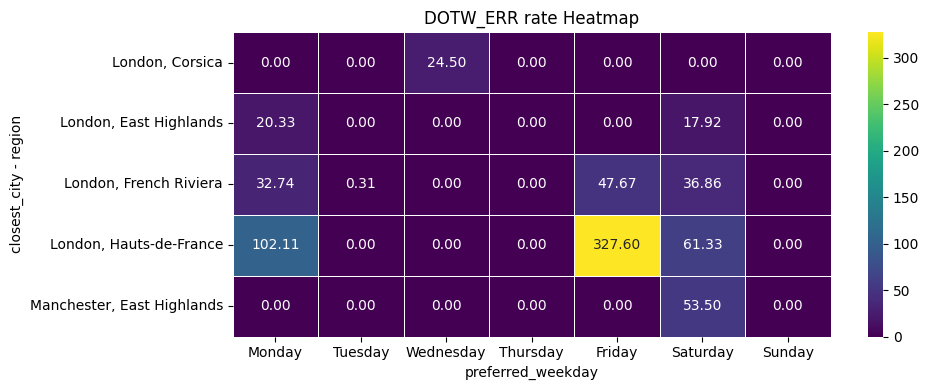

In [38]:
group_col1 = 'closestcity'
group_col2 = 'region'
col1 = 'closest_city - region'
col2 = 'preferred_weekday'
target_col = 'DOTW_ERR'
order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_tmp[col1] = df_tmp[group_col1] + ', ' + df_tmp[group_col2]
result = heatmap2(df_tmp,filtered_df_reset,col1,col2,target_col,order)

### 🔍 Analyzing DOTW Error Rate by Closest City + Region and Preferred Weekday

The DOTW error rates across city-region pairs reveal significant variations by preferred weekday, indicating the impact of booking timing on accommodation challenges:

### Weekday Peaks

- **London, Hauts-de-France**: Exceptionally high error rates on Friday (327.6%), with notable rates also on Monday (102.11%) and Saturday (61.33%), suggesting a concentrated demand or system strain towards the weekend.
- **London, French Riviera**: Shows peaks on Friday (47.67%), with significant rates on Monday (32.74%) and Saturday (36.86%), highlighting Friday as a critical booking day for this popular destination.

### Singular Peaks

- **London, Corsica**: A unique spike on Wednesday (24.5%), indicating mid-week booking challenges for trips to Corsica.
- **London, East Highlands**: Peaks on Monday (20.33%) and Saturday (17.92%), suggesting specific days with higher booking demand or issues.

### Zero Error Days

- Across analyzed city-region pairs, several days like Tuesday, Wednesday, and Thursday often show zero error rates, indicating smoother booking experiences on these weekdays.


### 4. 🛏 DOTW Error Rate vs. Room Count Analysis

- **Objective**: Assess how increasing room counts affect DOTW error rates, potentially identifying specific thresholds where error rates notably increase.

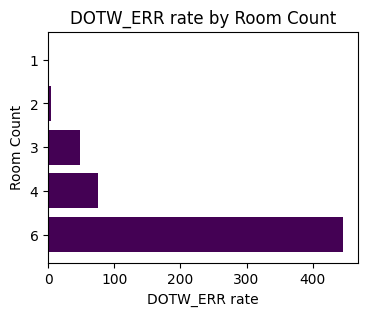

In [39]:
order = ['1','2','3','4','5','6']
normalized_error_data = error_rate(df,target_col,'roomcount','Room Count',4,3,True,order,False)

### 🔍 Analyzing DOTW Error rate by Room Count

- **High Room Counts**: The error rate skyrockets for requests involving 6 rooms (`446.5%`), indicating severe challenges in accommodating large group bookings through DOTW.
- **Decreasing Error Rates with Fewer Rooms**:
  - **Moderate Counts**: A room count of 4 sees a significant error rate of `75.33%`, while 3-room bookings experience a `47.43%` rate.
  - **Lower Counts**: The trend sharply declines for 2-room requests (`4.87%`), showing improved booking success as room count decreases.
- **Minimal Errors for Single Rooms**: Single-room bookings exhibit a minimal error rate (`0.051%`), suggesting high efficiency in accommodating individual or couple travelers.


## 📊 In-depth Analysis of No Routes Error Rates

Following the Kruskal-Wallis H test results, we'll dive deeper into understanding how the No Routes Error Rates are influenced across various categorical dimensions.

In [82]:
target_col = 'noroutes_ERR'
all_results_df = pd.DataFrame(columns=['categorical_column', 'p_value'])
for col in categorical_cols:
    results_df = kruskal_h_test(df, target_col, col)
    all_results_df = pd.concat([all_results_df, results_df], ignore_index=True)
kruskal_df = all_results_df[(all_results_df['p_value']<=0.05)].sort_values(by='p_value',ascending=True).reset_index(drop=True)
kruskal_df

C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3575816725.py:8: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  all_results_df = pd.concat([all_results_df, results_df], ignore_index=True)
C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  h_statistic, p_value = stats.kruskal(*[group[target_col] for name, group in df.groupby(col)])
C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a f

,categorical_column,p_value
0,region,0.000000e+00
1,lead_time_category,4.187377e-17
2,preferred_quarter,4.494954e-15
3,preferred_month,1.893190e-13
4,preferred_year,2.364456e-11
5,childcount,3.176064e-08
6,History,1.643474e-07
7,child_ages_bucket,7.320053e-07
8,creation_weekday,3.440736e-04
9,Food and Drink,9.658094e-04


## 🚫 Analysis of No Routes Error Rate

Following significant outcomes from the Kruskal-Wallis H test, a series of analyses are planned to dissect the "no routes error" across different dimensions. The objective is to pinpoint where and under what conditions users face challenges in finding available routes for their trips:

### 1. **Region Impact** (`p-value: 0.000000e+00`):
   - **Objective**: Assess how different regions influence the occurrence of no routes errors. The extremely low p-value for `region` indicates a strong regional effect on these errors.

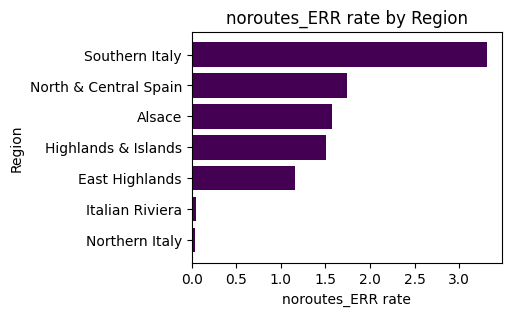

In [59]:
normalized_error_data = error_rate(df,target_col,'region','Region',4,3,False,[],True)

### 🔍 Analysis No Routes Error Rate by Region

Exploring the "no routes error" rates across different regions reveals critical insights into where travelers face the most significant challenges in finding available routes:

#### Regional Error Insights

- **High Error Rates**:
  - **Southern Italy**: Tops the list with a staggering error rate of `3.309148`, indicating severe difficulties in route availability.
  - **North & Central Spain** and **Alsace**: Follow with error rates of `1.737981` and `1.578218`, respectively, highlighting these regions as problematic areas.

- **Moderate Error Rates**:
  - **Highlands & Islands** and **East Highlands**: Show considerable challenges as well, with error rates of `1.501193` and `1.163889`, pointing to specific areas for route optimization.

- **Low Error Rates**:
  - **Italian Riviera** and **Northern Italy**: Exhibit minimal error rates (`0.048327` and `0.033708`), suggesting effective route availability in these regions.
 
#### 🎯 Strategic Takeaways

- **Focus on Troubled Regions**: Southern Italy, North & Central Spain, and Alsace require urgent attention to address route availability issues.


### 🕒 2. **Lead Time Category** (`p-value: 4.187377e-17`):
   - **Insight**: Explore the relationship between lead time for trip planning and no routes errors, understanding how advance planning impacts error rates.

C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:88: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_searches = df.groupby(col)['createtripid_region'].count().rename('total_searches')
C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:91: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_errors = df.groupby(col)[target_bucket].sum().rename('target_errors')


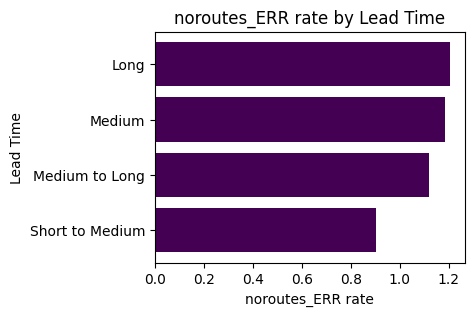

In [60]:
filtered_df_reset = error_rate(df,target_col,'lead_time_category','Lead Time',4,3,False,[],True)

### 🔍 No Routes Error Rate by Lead Time Category

An examination of "no routes error" rates across different lead time categories sheds light on how the timing of trip planning impacts the availability of routes:

#### Insights on Lead Time Impact

- **Varying Error Rates Across Categories**:
  - **Long Lead Time**: Exhibits the highest error rate of `1.204795`, indicating challenges in securing routes well in advance.
  - **Medium Lead Time**: Follows closely with an error rate of `1.182553`, suggesting similar difficulties for trips planned with a medium horizon.
  - **Medium to Long**: Shows a slightly lower rate of `1.118820`, indicating a marginal improvement in route availability for this planning window.
  - **Short to Medium**: Demonstrates the lowest error rate of `0.904523`, highlighting better route availability for nearer-term planning.

#### 🎯 Strategic Implications

- **Early Planning Challenges**: The higher error rates for long and medium lead times suggest a need for strategic improvements in early route availability.

### 🗺️ 3. **Region and Lead Time Interaction**:
   - **Analysis**: Delve into how specific combinations of regions and lead time categories affect the likelihood of encountering no routes errors, offering nuanced insights into planning timelines.

C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:296: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_errors = considered_group.groupby([col1,col2])[target_bucket].sum().rename('target_errors')


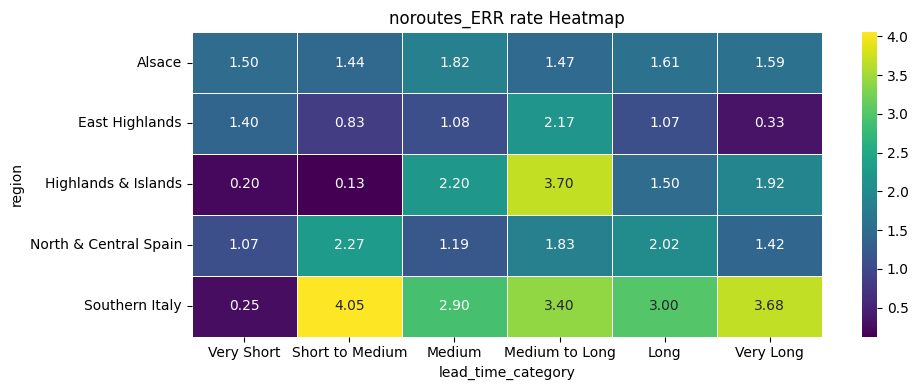

In [93]:
col1 = 'region'
col2 = 'lead_time_category'
order = ['Very Short','Short to Medium','Medium','Medium to Long','Long','Very Long']
normalized_error_data = error_rate_table(df,target_col,'region','Region',4,3,False,[],True)
normalized_error_data = normalized_error_data.reset_index()
result = heatmap2(df_tmp,normalized_error_data,col1,col2,target_col,order)

####  🔍 Analyzing No Routes Error Rate: Region by Lead Time Category

- **Varied Patterns Across Regions**:
  - **Alsace**: Exhibits relatively consistent error rates across all lead times, with a slight peak in "Medium" (`1.821`) to "Medium to Long" (`1.470`).
  - **East Highlands**: Peaks in "Medium to Long" (`2.173`), suggesting specific challenges in planning trips for this duration.
  - **Highlands & Islands**: Shows a significant increase in errors for "Medium to Long" (`3.700`) and maintains high rates into "Very Long" (`1.921`), highlighting extended planning challenges.
  - **North & Central Spain** and **Southern Italy**: Experience their highest error rates in "Short to Medium" (`2.267` and `4.055`, respectively), indicating difficulties in balancing demand and route availability for trips planned in this timeframe.#

### 🎯 Strategic Implications

- **Addressing Specific Regional Challenges**: Tailored strategies are required to mitigate no routes errors, particularly for trips planned with medium to long lead times in regions like the Highlands & Islands and Southern Italy.
- **Understanding Planning Horizons**: Insights into how different lead times affect route availability can guide improvements in route planning algorithms and user uidance.
s.

### 📆 4. **Region and Preferred Month** (`p-value: 1.893190e-13`):
   - **Seasonality**: Investigate how seasonal preferences within regions contribute to no routes errors, highlighting critical periods for targeted improvements.

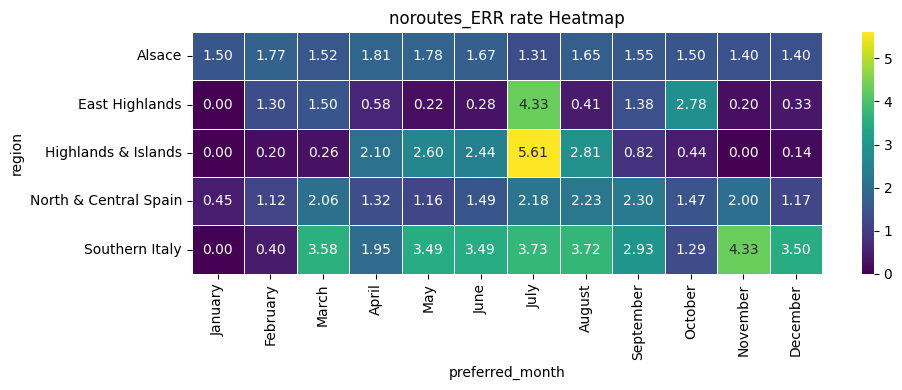

In [96]:
col1 = 'region'
col2 = 'preferred_month'
order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df_tmp = df.copy()
result = heatmap2(df_tmp,normalized_error_data,col1,col2,target_col,order)



### 🔍 No Routes Error Rate: Region by Preferred Month

An examination of "no routes error" rates across regions and preferred months reveals significant seasonal impacts on route availability:

#### Seasonal Variations

- **East Highlands**: Peaks in July (`4.333%`), indicating significant challenges during the summer. Error rates are notably lower in the winter months.
- **Highlands & Islands**: Highest in July (`5.609%`), showcasing similar summer challenges. Rates taper off towards the end of the year.
- **Italian Riviera**: Maintains low error rates year-round, with minimal fluctuations, highlighting effective route planning in this region.
- **Southern Italy**: Shows a consistent increase in error rates from March to August, peaking in July (`3.726%`), suggesting summer as a critical period.
- **Yorkshire**: Error rates fluctuate, peaking in November (`2.5%`), but remain low towards the end of the year.

#### 🎯 Strategic Implications

- **Addressing Summer Challenges**: Regions like East Highlands and Highlands & Islands require focused improvements to accommodate the summer demand surge.

### 👶 5. Child Count `(p -value 3.176064e-08)`

- **Investigate Impact**: Determine if and how varying child counts affect the incidence of no routes errors. The high p-value suggests there might not be a strong direct correlation, but nuances in data could provide valuable insights.


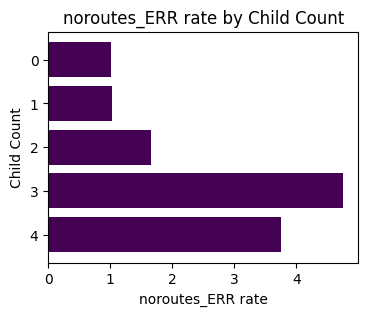

In [97]:
order = ['0','1','2','3','4']
normalized_error_data = error_rate(df,target_col,'childcount','Child Count',4,3,True,order,False)

### 🔍 No Routes Error Rate by Child Count

#### Key Findings

- **Higher Rates with More Children**: 
  - Families with **3 children** experience the highest error rate (`4.761194`), followed by those with **4 children** (`3.750`), indicating significant challenges in finding routes for larger family groups.
  
- **Decreasing Error Rates with Fewer Children**:
  - The error rate decreases for families with **2 children** (`1.650873`) and further for **1 child** (`1.022814`), suggesting better route availability for smaller family units.
  
- **Comparable Rates for Solo and Small Groups**:
  - Interestingly, trips planned without children (`0`) have a similar error rate (`1.016492`) to those with one child, highlighting a baseline level of difficulty in route planning regardless of family size.

#### 🚀 Strategic Implications

- **Tailoring to Family Needs**: The data underscores the importance of enhancing route planning features to accommodate larger families, potentially through more flexible or inclusive routing options.


## ⚖️ In-depth Analysis of Bad Proportion Error Rates

In [112]:
target_col = 'badproportion_ERR'
all_results_df = pd.DataFrame(columns=['categorical_column', 'p_value'])
for col in categorical_cols:
    results_df = kruskal_h_test(df, target_col, col)
    all_results_df = pd.concat([all_results_df, results_df], ignore_index=True)
kruskal_df = all_results_df[(all_results_df['p_value']<=0.05)].sort_values(by='p_value',ascending=True).reset_index(drop=True)
kruskal_df

C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3725473215.py:8: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  all_results_df = pd.concat([all_results_df, results_df], ignore_index=True)
C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  h_statistic, p_value = stats.kruskal(*[group[target_col] for name, group in df.groupby(col)])
C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a f

,categorical_column,p_value
0,trip_duration_bucket,0.000000e+00
1,region,1.896078e-253
2,closestcity,2.327315e-72
3,preferred_month,1.373373e-54
4,lead_time_category,3.788808e-50
5,preferred_quarter,7.546305e-48
6,preferred_weekday,1.773149e-26
7,Arts and Culture,2.394608e-18
8,History,2.466653e-11
9,NA,1.168271e-09


## 📊  Combination Analyses for Bad Proportion Errors

The following are logical combinations for in-depth analysis given the Kruskal test result:

### **Closest City to Region + Trip Duration 🌍⏳**
- **Objective**: Identify if trip length within specific routes influences the likelihood of encountering bad proportion errors. This analysis can reveal route preferences or constraints affecting trip balance.

C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:245: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='normalized_error_rate', y='group_label', data=filtered_df_reset, palette="viridis")


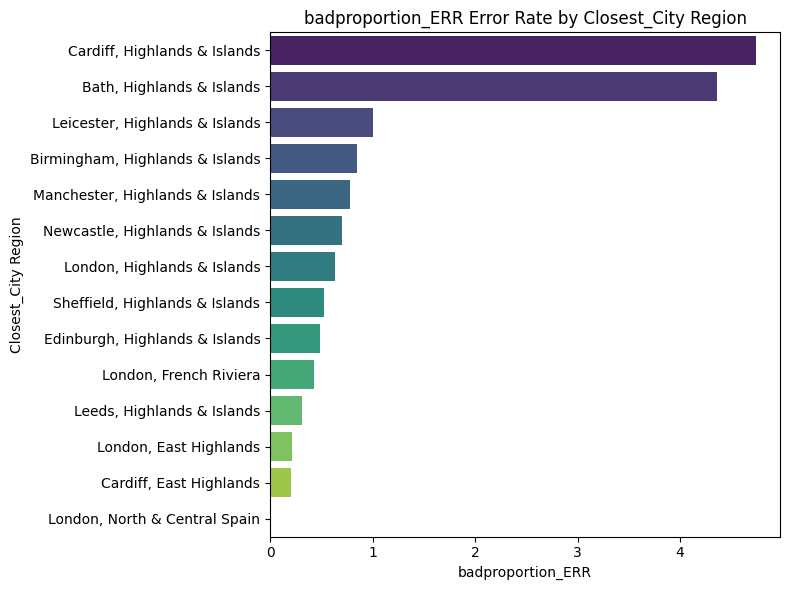

In [113]:
cols = ['closestcity', 'region']
col_names = 'Closest_City Region'
df_tmp = df.copy()
filtered_df_reset = grouped_error_rate_2(df_tmp,target_col,cols,col_names,8,6)

C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:296: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_errors = considered_group.groupby([col1,col2])[target_bucket].sum().rename('target_errors')


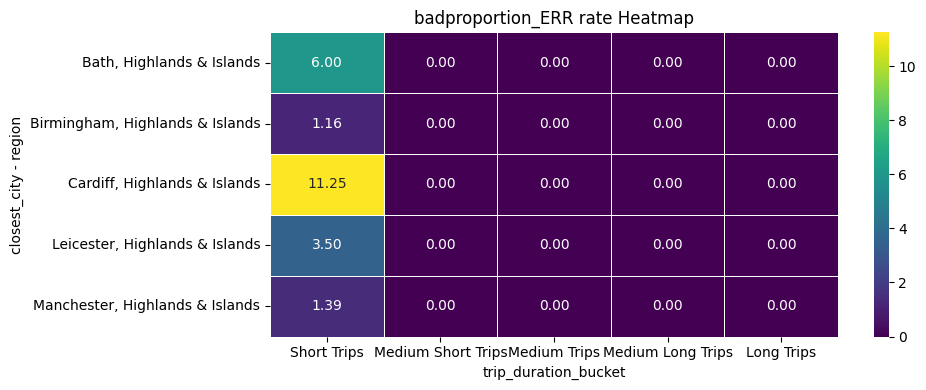

In [114]:
group_col1 = 'closestcity'
group_col2 = 'region'
col1 = 'closest_city - region'
col2 = 'trip_duration_bucket'
order = ['Short Trips' , 'Medium Short Trips' , 'Medium Trips' , 'Medium Long Trips' , 'Long Trips']
df_tmp[col1] = df_tmp[group_col1] + ', ' + df_tmp[group_col2]
result = heatmap2(df_tmp,filtered_df_reset,col1,col2,target_col,order)

### 🔍 Analysis on Trip Duration and Closest City + Region

An in-depth look at the bad proportion error rates across different trip durations for specific closest city and region pairs reveals significant insights into trip planning challenges:

#### Insights on Trip Duration

- **High Error Rates for Short Trips**:
  - **Cardiff, Highlands & Islands** stands out with an exceptionally high error rate (`11.25`) for Short Trips, indicating substantial difficulties in planning balanced trips of shorter duration from Cardiff.
  - **Bath, Highlands & Islands** and **Leicester, Highlands & Islands** also show notable error rates (`6.0` and `3.5`, respectively), further highlighting challenges with short-duration trip planning in these areas.

- **Zero Error Rates for Longer Durations**:
  - Across all city-region pairs, there are no bad proportion errors reported for Medium Short Trips, Medium Trips, Medium Long Trips, and Long Trips, indicating effective planning and trip balancing for these longer durations.

#### 🎯 Strategic Takeaways

- **Targeted Improvement for Short Trips**: The pronounced error rates for Short Trips, especially from cities like Cardiff and Bath, suggest a need for focused improvements in short trip planning and balancing mechanisms.
- **Successful Longer Duration Planning**: The absence of errors in longer trip categories across all regions suggests that current planning tools are effective for these durations and could potentially inform strategies to address short trip challenges.


In [ ]:
cat = df.select_dtypes(exclude=['number']).columns.tolist()
selected_num_cols = [x for x in nums_cols if x not in ['createtripid','nogoodscore_ERR_bucket',
 'DOTW_ERR_bucket','success']+error_columns]

## Combined Analysis of Errors vs Categories

In [118]:
columns_to_analyze = [ 'closestcity','region','preferred_month','preferred_weekday','creation_weekday','creation_hour','request_weekday',
                      'request_hour','adultcount','childcount','roomcount','twinroompreferred','child_ages_bucket','trip_duration_bucket',
                      'lead_time_category','tripbuildtime_bucket','History','Arts and Culture','Good for kids','Nature','Relaxation','Food and Drink',
                      'Nightlife','NA']

errors_rearranged = [ 'DOTW_ERR','firstaccommodation_ERR','substaccommodation_ERR','manualfallback_ERR','noroutes_ERR','timeout_ERR',
                     'badproportion_ERR','nogoodscore_ERR']


combined_kruskal_test = combined_kruskal_function(df,columns_to_analyze,errors_rearranged)

C:\Users\shash\AppData\Local\Temp\ipykernel_22484\4032161277.py:44: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  all_results_df = pd.concat([all_results_df, results_df], ignore_index=True)
C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  h_statistic, p_value = stats.kruskal(*[group[target_col] for name, group in df.groupby(col)])
C:\Users\shash\AppData\Local\Temp\ipykernel_22484\4032161277.py:44: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is depre

### Please note: The green cells represent no significance

C:\Users\shash\AppData\Local\Temp\ipykernel_22484\2127894286.py:12: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  norm_data_adjusted = combined_kruskal_test.applymap(lambda x: calculate_color_intensity(x, threshold))


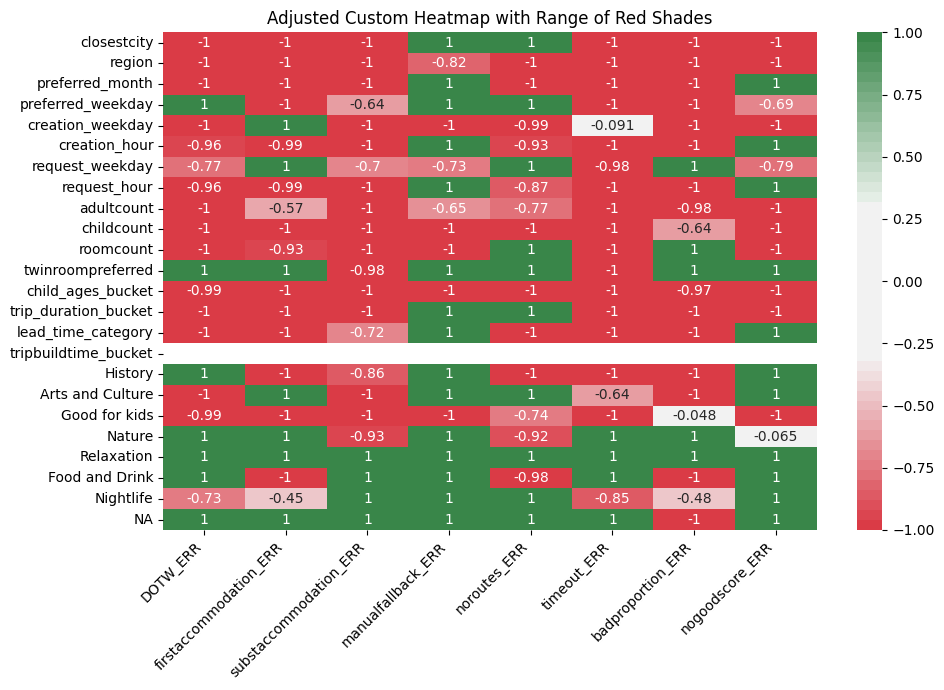

In [119]:
plot_combined_kruskal_plot(combined_kruskal_test)

### Significant Findings

- **Region's Impact 🌍**: Strong significance across errors, especially with `firstaccommodation_ERR` (`0.000000e+00`) and `badproportion_ERR` (`1.896078e-253`), highlights regional influences on accommodation challenges and trip balance.

- **Lead Time Category ⏳**: Notable for its impact on `noroutes_ERR` (`4.187377e-17`) and `badproportion_ERR` (`3.788808e-50`), suggesting that planning horizon affects route availability and trip proportionality.

- **Trip Duration 📅**: The `trip_duration_bucket` shows a profound effect on `badproportion_ERR` (`0.000000e+00`), indicating that the length of the trip is crucial in maintaining trip balance.

- **Child Count and Room Count 👶🛏️**: Highlight a significant relationship with several errors, particularly `substaccommodation_ERR` (`8.014388e-39` for `childcount`) and `DOTW_ERR` (`2.034543e-37` for `roomcount`), underlining the complexities in accommodating families and larger groups.


In [140]:
combined_kruskal_test_t = combined_kruskal_test.T

## 🏙️ Closest Cities vs. Trip Planning Errors

In [129]:
category = 'closestcity'
top_5_category_errors(combined_kruskal_test_t,category)

,DOTW_ERR,firstaccommodation_ERR,substaccommodation_ERR,timeout_ERR,badproportion_ERR,nogoodscore_ERR
0,London,Luton,Luton,Harrogate,Guildford,Cheltenham
1,Manchester,Warwick,Warwick,Llandudno,Cambridge,Cambridge
2,Warwick,Harwich,Harwich,Wolverhampton,Chichester,Guildford
3,Norwich,Leicester,Norwich,Ipswich,Chelmsford,Coventry
4,Harwich,Norwich,Manchester,Guildford,Ashford,Luton


### Insights

Analyzing the top closest cities associated with various trip planning errors highlights specific challenges and opportunities for improvement:

- **Accommodation Challenges**:
  - Cities like **Luton** and **Warwick** face notable difficulties with direct bookings (`DOTW_ERR`) and finding substitute accommodations (`substaccommodation_ERR`).

- **System Performance**:
  - **Harrogate** and **Llandudno** are key for `timeout_ERR`, suggesting areas where system enhancements could greatly benefit user experiences.

- **Trip Quality Issues**:
  - **Guildford** and **Cambridge** stand out in `badproportion_ERR` and `nogoodscore_ERR`, indicating potential for better trip balancing and quality assessments from these origins.


## 🌍 Regional Insights on Trip Planning Errors

In [126]:
top_5_category_errors(combined_kruskal_test_t,'region')

,DOTW_ERR,firstaccommodation_ERR,substaccommodation_ERR,manualfallback_ERR,noroutes_ERR,timeout_ERR,badproportion_ERR,nogoodscore_ERR
0,Hauts-de-France,Hauts-de-France,Hauts-de-France,French Riviera,Germany,Corsica,East Highlands,Corsica
1,French Riviera,French Riviera,French Riviera,East Highlands,West Country,Hauts-de-France,Highlands & Islands,Catalonia
2,East Highlands,East Highlands,East Highlands,NaN,Southern Italy,Switzerland,French Riviera,Hauts-de-France
3,Corsica,Cornwall,Corsica,NaN,Cornwall,Catalonia,Cornwall,Highlands & Islands
4,Cornwall,Corsica,Cornwall,NaN,North & Central Spain,French Riviera,Netherlands,Andalusia


### Insights

The correlation between regions and trip planning errors uncovers specific areas that could benefit from targeted improvements:

- **Accommodation and Manual Fallback Challenges**:
  - **Hauts-de-France** and **French Riviera** consistently appear across `DOTW_ERR`, `firstaccommodation_ERR`, and `substaccommodation_ERR`, indicating significant accommodation booking challenges.
  - Notably, **French Riviera** also faces `manualfallback_ERR`, suggesting a need for better backup options.

- **Route and Timeout Issues**:
  - Unique regions like **Germany** and **Corsica** are highlighted for `noroutes_ERR` and `timeout_ERR`, pointing to potential route availability and system performance issues.

- **Trip Balance and Quality Concerns**:
  - **East Highlands** and **Corsica** stand out in `badproportion_ERR` and `nogoodscore_ERR`, hinting at difficulties in planning balanced, high-quality trips from these regions.


## ⏳ Lead Time Category Insights on Trip Planning Errors

In [135]:
category = 'lead_time_category'
top_5_category_errors(combined_kruskal_test_t,category)

C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_searches = df.groupby(col)['createtripid_region'].count().rename('total_searches')
C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:51: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_errors = df.groupby(col)[target_bucket].sum().rename('target_errors')
C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current

,DOTW_ERR,firstaccommodation_ERR,substaccommodation_ERR,noroutes_ERR,timeout_ERR,badproportion_ERR
0,Medium,Medium,Medium,Very Long,Long,Very Short
1,Medium to Long,Medium to Long,Medium to Long,Long,Short to Medium,Short to Medium
2,Long,Long,Long,Medium,Medium to Long,Medium
3,Short to Medium,Short to Medium,Short to Medium,Medium to Long,Very Short,Long
4,Very Long,Very Long,Very Long,Short to Medium,Medium,Very Long


### Insights

The association between lead time categories and trip planning errors provides valuable insights into when travelers are most likely to encounter issues:

- **Accommodation Errors (DOTW, First, Substitute)**:
  - **Medium** and **Medium to Long** lead times are consistently linked with higher rates of accommodation-related errors, suggesting challenges in securing bookings during these periods.
  - **Long** and **Very Long** categories also show significant impacts, indicating potential difficulties with advance planning.

- **Route Availability Issues**:
  - **Very Long** and **Long** lead times are notably problematic for `noroutes_ERR`, with **Medium** and **Medium to Long** also affected, highlighting challenges in finding available routes far in advance.

- **Timeout and Bad Proportion Errors**:
  - **Timeout_ERR** peaks at both extremes, **Very Long** and **Very Short**, suggesting system performance issues under varying planning horizons.
  - **Badproportion_ERR** is most significant for **Very Short** lead times, indicating difficulties in balancing trip elements for immediate plans.

#### 🚀 Strategic Focus

- **Optimizing Advance Bookings**: Enhancing accommodation booking processes for **Medium** to **Very Long** lead times can address key challenges in trip preparation.
- **Improving Route Planning**: For **Long** to **Very Long** lead times, targeted improvements in route availability can significantly benefit advance planners.
- **Balancing Trip Elements**: Focusing on **Very Short** to **Medium** lead times can help mitigate bad proportion errors, ensuring well-balanced trips.

#### 💡 Conclusion

Addressing lead time-specific challenges offers a pathway to reducing trip planning errors, enhancing the overall planning experience across different planning horizons.



### 📅 Trip Duration Insights on Trip Planning Errors

In [138]:
category = 'trip_duration_bucket'
top_5_category_errors(combined_kruskal_test_t,category)

C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_searches = df.groupby(col)['createtripid_region'].count().rename('total_searches')
C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:51: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_errors = df.groupby(col)[target_bucket].sum().rename('target_errors')
C:\Users\shash\AppData\Local\Temp\ipykernel_22484\3451720300.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current

,DOTW_ERR,firstaccommodation_ERR,substaccommodation_ERR,timeout_ERR,badproportion_ERR,nogoodscore_ERR
0,Medium Short Trips,Medium Short Trips,Medium Short Trips,Medium Long Trips,Short Trips,Short Trips
1,Short Trips,Medium Long Trips,Short Trips,Medium Trips,Medium Short Trips,Medium Short Trips
2,Medium Long Trips,Medium Trips,Medium Long Trips,Medium Short Trips,NaN,Long Trips
3,Medium Trips,Long Trips,Medium Trips,Long Trips,NaN,Medium Long Trips
4,Long Trips,Short Trips,Long Trips,Short Trips,NaN,Medium Trips


### Insights

Exploring the link between trip duration and trip planning errors reveals key durations that are more susceptible to specific issues:

- **Accommodation Errors (DOTW, First, Substitute)**:
  - **Medium Short Trips** are a hotspot for accommodation-related errors, suggesting difficulties in securing bookings for trips of this length.
  - **Short Trips** and **Medium Long Trips** also see notable error rates, indicating challenges at both shorter and slightly longer durations.

- **Timeout and Bad Proportion Errors**:
  - **Timeout_ERR** is particularly problematic for **Medium Long Trips** and **Medium Trips**, suggesting system performance issues during these durations.
  - **Badproportion_ERR** is most pronounced for **Short Trips**, highlighting difficulties in balancing trip elements for quick getaways.

- **No Good Score Errors**:
  - **Short Trips** and **Medium Short Trips** are significantly affected, alongside **Long Trips** and **Medium Long Trips**, pointing to quality issues in planning trips of these lengths.


## 📆 Preferred Month Insights on Trip Planning Errors
####  <span style="color:red;">(Please note, there was an error on retreiving the error_rate values in a specific table format to plot on time series plot, so displaying only the top 5 categories instead) </span>

In [169]:
category = 'preferred_month'
top_5_category_errors(combined_kruskal_test_t,category)

,DOTW_ERR,firstaccommodation_ERR,substaccommodation_ERR,noroutes_ERR,timeout_ERR,badproportion_ERR
0,August,August,August,November,September,October
1,May,May,May,August,July,February
2,June,July,March,October,October,March
3,March,March,June,May,March,April
4,July,June,July,July,August,December


### Insights 

The relationship between preferred travel month and trip planning errors highlights seasonal patterns affecting the booking process and trip quality:

- **Accommodation Errors (DOTW, First, Substitute)**:
  - High incidence of errors in **August** and **May**, suggesting peak demand challenges. **March**, **June**, and **July** also show vulnerability, indicating broader summer planning difficulties.

- **Route Availability and Timeout Errors**:
  - **Noroutes_ERR** peaks in **November** and **August**, pointing to specific seasonal route availability issues.
  - **Timeout_ERR** is pronounced in **September** and **July**, possibly due to increased system load during late summer.

- **Bad Proportion Errors**:
  - Noticeable in **October** and **February**, with **March**, **April**, and **December** also affected, suggesting planning imbalances related to school holidays and festive seasons.

## 📅 Preferred Weekday Insights on Trip Planning Errors

In [171]:
category = 'preferred_weekday'
top_5_category_errors(combined_kruskal_test_t,category)

,firstaccommodation_ERR,substaccommodation_ERR,timeout_ERR,badproportion_ERR,nogoodscore_ERR
0,Friday,Friday,Sunday,Friday,Friday
1,Saturday,Saturday,Saturday,Tuesday,Tuesday
2,Monday,Monday,Tuesday,Saturday,Saturday
3,Wednesday,Tuesday,Monday,Wednesday,Monday
4,Tuesday,Wednesday,Friday,Thursday,Wednesday


### Insights

Exploring how the preferred day of the week influences trip planning errors reveals specific weekdays where travelers face increased challenges:

- **Accommodation Errors (First, Substitute)**:
  - **Friday** and **Saturday** are particularly problematic, indicating high demand for accommodations leading into the weekend. **Monday** and **Tuesday** also show elevated error rates, suggesting the start of the week is challenging for booking accommodations.

- **Timeout and Bad Proportion Errors**:
  - **Timeout_ERR** peaks on **Sunday** and **Saturday**, possibly due to high traffic on the platform as travelers finalize plans for the upcoming week.
  - **Badproportion_ERR** is most significant on **Friday**, with **Tuesday** and **Saturday** also notable, indicating difficulties in balancing trip components at the week's bookends.

- **No Good Score Errors**:
  - **Friday** and **Tuesday** are key days for **nogoodscore_ERR**, alongside **Saturday** and **Monday**, pointing to quality issues in trips planned for these days.

## Aggregated Preferred Month on Trip Planning Errors 
### <span style="color:red;">  (Can be misleading in terms of popularity vs error) </span> 

In [132]:
df1 = df.copy()
col = 'preferred_month'
error_types = ['DOTW_ERR','noroutes_ERR','badproportion_ERR']

aggregated_months(df1,col,error_types)

## Final Thoughts:

## 🛠️ Comprehensive Actionable Insights for Trip Planning Enhancement

Drawing on the insights gathered, we outline strategic steps to address errors, enhance the trip builder, establish performance monitoring metrics, and leverage data for product evolution.

### 1. **Root Causes for Observed Errors 🔍**

- **Accommodation Challenges 🏨**: Peak seasons (e.g., August, May) and specific regions (e.g., Hauts-de-France) strain the booking system, causing `DOTW_ERR` and `firstaccommodation_ERR`.
- **Route Availability Issues 🗺️**: Scarce routes for very long lead times and certain regions (e.g., Corsica) lead to `noroutes_ERR`.
- **System Performance Bottlenecks ⏳**: Weekend surges and peak lead times trigger `timeout_ERR`, indicating the need for scalable solutions.
- **Trip Balancing Difficulties ⚖️**: Short trips and immediate planning face `badproportion_ERR`, suggesting a lack of balanced trip recommendations.

### 2. **Trip Builder Improvements 🛠️**

- **Strengthen Accommodation Partnerships 🤝**: Enhance agreements in high-demand areas to reduce accommodation errors.
- **Enhance Route Planning Algorithms 🔄**: Develop adaptive routing to improve availability, especially for underrepresented regions and times.
- **Upgrade System Infrastructure 💻**: Bolster backend systems to manage peak loads efficiently, reducing `timeout_ERR`.
- **Refine Trip Balancing Recommendations 🔍**: Introduce smarter algorithms for ensuring trip proportionality, particularly for short or last-minute trips.

### 3. **Refined Performance Monitoring Metrics 📊**

Leveraging these insights, I propose targeted metrics to oversee and enhance the trip building engine's performance:

- **Segmented Error Rate Analysis 📉**: Monitor error rates (e.g., `DOTW_ERR`, `timeout_ERR`) by region, season, and lead time to identify and address specific challenges.
- **Booking Success Rate by Category 🎯**: Differentiate between accommodation and route planning success rates, especially during peak travel periods, to pinpoint improvement areas.
- **User Feedback Analysis 💬**: Collect detailed feedback on encountered errors and satisfaction scores, focusing on improving areas with high error rates like accommodation issues (`substaccommodation_ERR`) and trip quality concerns (`nogoodscore_ERR`).
- **System Performance and Response Times ⏲️**: Track system responsiveness during high-traffic periods to assess and improve backend scalability and reduce `timeout_ERR`.
- **Trip Quality and Balancing Metrics 🔍**: Develop indices to measure trip balance and quality, aiming for improvements in areas highlighted by `badproportion_ERR` and `nogoodscore_ERR`.

### 4. **Leveraging Insights for Product and Tech Evolution 🔄**

Utilizing these metrics and insights enables data-driven decision-making and iterative product evolution:

- **Strategic Planning with Data 📈**: Use error rate analysis and user feedback to prioritize feature development and system improvements where they will have the most significant impact on user experience.
- **User-Centric Product Enhancements 🧑‍🤝‍🧑**: Tailor the trip planning process to better accommodate user needs based on insights from error analysis, such as regional demand and seasonal booking trends.
- **Tech Infrastructure Evolution 🚀**: Guide technological upgrades and infrastructure improvements with data on system performance and error rates, ensuring the platform's scalability and reliability.
- **Continuous Improvement Cycle 🔁**: Establish a feedback loop using the refined metrics to continuously refine and evolve the trip planning engine based on real-world performance and user feedback, fostering a culture of continuous improvement and innovation.

By addressing these areas with focused actions and continuous monitoring, the trip planning platform can significantly enhance its performance, user satisfaction, and market competitiveness.

----

## Additional Data for Enhanced Error Analysis

To deepen our error analysis and uncover hidden patterns, considering these data points could be valuable:

1. **User Feedback and Ratings**: Insights into user experience beyond the numerical error counts.
2. **Geographic Information**: I wanted to map the routes using geopandas and that would have been very interesting to see against different errors on the map.
3. **User Demographics**: How different user groups experience errors.
4. **Historical Booking Data**: Patterns in booking behavior that lead to errors.
5. **Competitor Data**: Industry standards and user expectations.
6. **Time to Error**: Identifying at which stage users encounter issues.
7. **Interaction Data**: User behaviors or features correlated with errors.

Exploring these areas can provide a holistic view of errors, guiding predictive and preventive measures to enhance user satisfaction.
